In [1]:
%cd /sound-spaces

/sound-spaces


In [2]:
import os
os.environ['MAGNUM_LOG'] = 'verbose'
os.environ['HABITAT_SIM_LOG'] = 'sim=Debug:sensor=Debug'

In [3]:
import os
import quaternion
import habitat_sim.sim
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt
plt.rc('figure', figsize=(15, 5))

HI


/opt/conda/envs/soundspaces/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
%%capture
dataset = 'gibson' # or replace with 'mp3d', one example for each dataset

backend_cfg = habitat_sim.SimulatorConfiguration()
if dataset == 'mp3d':
    backend_cfg.scene_id = "data/scene_datasets/mp3d/UwV83HsGsw3/UwV83HsGsw3.glb"
    # IMPORTANT: missing this file will lead to load the semantic scene incorrectly
    backend_cfg.scene_dataset_config_file = "data/scene_datasets/mp3d/mp3d.scene_dataset_config.json"
else:
    backend_cfg.scene_id = "data/scene_datasets/gibson_data/gibson/Oyens.glb"
    # IMPORTANT: missing this file will lead to load the semantic scene incorrectly
    backend_cfg.scene_dataset_config_file = "data/scene_datasets/gibson_data/gibson/gibson_semantic.scene_dataset_config.json"
backend_cfg.load_semantic_mesh = True
backend_cfg.enable_physics = False
agent_config = habitat_sim.AgentConfiguration()
cfg = habitat_sim.Configuration(backend_cfg, [agent_config])
sim = habitat_sim.Simulator(cfg)

# set navmesh path for searching for navigable points
if dataset == 'mp3d':
    sim.pathfinder.load_nav_mesh(os.path.join(f"data/scene_datasets/mp3d/UwV83HsGsw3/UwV83HsGsw3.navmesh"))
else:
    sim.pathfinder.load_nav_mesh(os.path.join(f"data/scene_datasets/gibson/Oyens.navmesh"))

audio_sensor_spec = habitat_sim.AudioSensorSpec()
audio_sensor_spec.uuid = "audio_sensor"
audio_sensor_spec.enableMaterials = True
audio_sensor_spec.channelLayout.channelType = habitat_sim.sensor.RLRAudioPropagationChannelLayoutType.Ambisonics
audio_sensor_spec.channelLayout.channelCount = 4
# audio sensor location set with respect to the agent
audio_sensor_spec.position = mic_pos = [0.0, 1.5, 0.0]  # audio sensor has a height of 1.5m
audio_sensor_spec.acousticsConfig.sampleRate = 48000
# whether indrect (reverberation) is present in the rendered IR
audio_sensor_spec.acousticsConfig.indirect = True
sim.add_sensor(audio_sensor_spec)

# # In the 1st example, we attach only one sensor,
# # a RGB visual sensor, to the agent
# rgb_sensor_spec = habitat_sim.CameraSensorSpec()
# rgb_sensor_spec.uuid = "color_sensor"
# rgb_sensor_spec.sensor_type = habitat_sim.SensorType.COLOR
# rgb_sensor_spec.resolution = [480, 720]
# rgb_sensor_spec.position = mic_pos
# sim.add_sensor(rgb_sensor_spec)

audio_sensor = sim.get_agent(0)._sensors["audio_sensor"]
audio_sensor.setAudioMaterialsJSON("data/mp3d_material_config.json")

[21:31:32:364491]:[Debug]:[Sim] Simulator.cpp(271)::createSceneInstance : Loading navmesh from data/scene_datasets/gibson_data/gibson/Oyens.navmesh


[21:31:32:364456]:[Warning]:[Metadata] SceneDatasetAttributes.cpp(107)::addNewSceneInstanceToDataset : Dataset : 'gibson_semantic' : Lighting Layout Attributes 'no_lights' specified in Scene Attributes but does not exist in dataset, so creating default.


[21:31:32:364561]:[Debug]:[Sim] Simulator.cpp(273)::createSceneInstance : Navmesh Loaded.
[21:31:32:364692]:[Debug]:[Sim] Simulator.cpp(377)::createSceneInstance : Using scene instance-specified Light Setup key : ` no_lights `.
[21:31:32:364730]:[Debug]:[Sim] Simulator.cpp(535)::instanceStageForSceneAttributes : Start to load stage named : data/scene_datasets/gibson_data/gibson/Oyens.glb with render asset : data/scene_datasets/gibson_data/gibson/Oyens.glb and collision asset : data/scene_datasets/gibson_data/gibson/Oyens.glb
[21:31:32:718092]:[Debug]:[Sim] Simulator.cpp(562)::instanceStageForSceneAttributes : Successfully loaded stage named : data/scene_datasets/gibson_data/gibson/Oyens.glb
[21:31:32:718122]:[Debug]:[Sim] Simulator.cpp(213)::reconfigure : CreateSceneInstance success == true for active scene name : data/scene_datasets/gibson_data/gibson/Oyens.glb  without renderer.
[21:31:32:719250]:[Debug]:[Sensor] AudioSensor.cpp(24)::AudioSensorSpec : [Audio]  AudioSensorSpec constru

In [24]:
# sampled navigable point is on the floor
print(sim.pathfinder.get_random_navigable_point())
# nav_pos = [3, 0.01, 8.86] #sim.pathfinder.get_random_navigable_point()
nav_pos = [2.6282403, 0.01496243, 6.8579893 ]
source_pos = nav_pos + np.array([0, 1.5, 0])
mic_pos = nav_pos + np.array([2, 0, 0])
print('Sample source location: ', source_pos)
print('Sample mic location: ', mic_pos)

[2.6832552  0.01496243 3.0250573 ]
Sample source location:  [2.6282403  1.51496243 6.8579893 ]
Sample mic location:  [4.6282403  0.01496243 6.8579893 ]


In [18]:
import trimesh
scene = trimesh.load(backend_cfg.scene_id)
rotation_matrix = trimesh.transformations.rotation_matrix(-np.radians(90), [1, 0, 0])
scene.apply_transform(rotation_matrix)
scene.geometry['defaultobject'].visual = scene.geometry['defaultobject'].visual.to_color()
scene.geometry['defaultobject'].visual.face_colors = [255, 235, 255]
# mic
sphere = trimesh.creation.uv_sphere(radius=0.2)
sphere.apply_translation(mic_pos)
sphere.visual.face_colors = [255, 0, 0]
scene.add_geometry(sphere)
# source
sphere = trimesh.creation.uv_sphere(radius=0.2)
sphere.apply_translation(source_pos)
 # + np.array([0, 0, 1.5])
sphere.visual.face_colors = [0, 255, 0]
scene.add_geometry(sphere)
scene.add_geometry(trimesh.creation.axis())
scene.show()

failed to load image!
Traceback (most recent call last):
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/trimesh/exchange/gltf.py", line 1270, in _parse_textures
    images[i] = PIL.Image.open(util.wrap_as_stream(blob))
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/PIL/Image.py", line 3318, in open
    im = _open_core(fp, filename, prefix, formats)
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/PIL/Image.py", line 3305, in _open_core
    _decompression_bomb_check(im.size)
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/PIL/Image.py", line 3215, in _decompression_bomb_check
    raise DecompressionBombError(msg)
PIL.Image.DecompressionBombError: Image size (268435456 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.


In [47]:
from scipy.spatial.transform import Rotation as R
def transform(v):
    v0 = np.array(v)
    transform = R.from_euler('xyz', [0, 0, -90], degrees=True).as_matrix()
    v = np.array(v) @ transform.T
    print(np.round(v0,2), np.round(v,2))
    return v

height = np.array([0.0, 1.5, 0.0])
# height = np.array([0.0, 0.0, 1.5])

In [48]:
import trimesh
scene = trimesh.load(backend_cfg.scene_id)
rotation_matrix = trimesh.transformations.rotation_matrix(-np.radians(90), [1, 0, 0])
scene.apply_transform(rotation_matrix)
scene.geometry['defaultobject'].visual = scene.geometry['defaultobject'].visual.to_color()
scene.geometry['defaultobject'].visual.face_colors = [255, 235, 255]
# mic
sphere = trimesh.creation.uv_sphere(radius=0.2)
sphere.apply_translation(transform(mic_pos))
sphere.visual.face_colors = [255, 0, 0]
scene.add_geometry(sphere)
# source
sphere = trimesh.creation.uv_sphere(radius=0.2)
sphere.apply_translation(transform(source_pos))
 # + np.array([0, 0, 1.5])
sphere.visual.face_colors = [0, 255, 0]
scene.add_geometry(sphere)
scene.add_geometry(trimesh.creation.axis())
scene.show()

failed to load image!
Traceback (most recent call last):
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/trimesh/exchange/gltf.py", line 1270, in _parse_textures
    images[i] = PIL.Image.open(util.wrap_as_stream(blob))
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/PIL/Image.py", line 3318, in open
    im = _open_core(fp, filename, prefix, formats)
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/PIL/Image.py", line 3305, in _open_core
    _decompression_bomb_check(im.size)
  File "/opt/conda/envs/soundspaces/lib/python3.9/site-packages/PIL/Image.py", line 3215, in _decompression_bomb_check
    raise DecompressionBombError(msg)
PIL.Image.DecompressionBombError: Image size (268435456 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.


[4.63 0.01 6.86] [ 0.01 -4.63  6.86]
[2.63 1.51 6.86] [ 1.51 -2.63  6.86]


In [49]:
# from PIL import Image
audio_sensor.setAudioSourceTransform(transform(source_pos))
agent = sim.get_agent(0)
new_state = sim.get_agent(0).get_state()
new_state.position = np.array(transform(mic_pos))
new_state.sensor_states = {}
agent.set_state(new_state, True)
observations = sim.get_sensor_observations()
# rgb_img = Image.fromarray(observations["color_sensor"], mode="RGBA")
ir = np.array(observations["audio_sensor"])
print(ir.shape)

# one a category is not found in the material mapping file, the default acoustic material will be used.

[2.63 1.51 6.86] [ 1.51 -2.63  6.86]
[4.63 0.01 6.86] [ 0.01 -4.63  6.86]
about to run the simulation
[21:40:02:913262]:[Debug]:[Sensor] AudioSensor.cpp(81)::setAudioSourceTransform : [Audio]  Setting the audio source position :  Vector(1.51496, -2.62824, 6.85799) ]
simulation ran
[21:40:02:913841]:[Debug]:[Sensor] AudioSensor.cpp(91)::setAudioListenerTransform : [Audio]  Setting the agent transform : position [ Vector(0.0149624, -3.12824, 6.85799) ], rotQuat[ Vector(1, 0, 2.45858e-05, 0) ]
[21:40:02:913857]:[Debug]:[Sensor] AudioSensor.cpp(279)::createAudioSimulator : [Audio]  Create audio simulator iteration:  7
[21:40:02:913876]:[Debug]:[Sensor] AudioSensor.cpp(115)::runSimulation : [Audio]  Running the audio simulator
[21:40:02:913882]:[Debug]:[Sensor] AudioSensor.cpp(144)::runSimulation : [Audio]  Adding source at position :  Vector(1.51496, -2.62824, 6.85799)
[21:40:02:913888]:[Debug]:[Sensor] AudioSensor.cpp(152)::runSimulation : Running simulation, folder :  /home/AudioSimulati

In [50]:
# # check if the direct sound is present (source is visibile from the listener)
# audio_sensor.sourceIsVisible()

In [51]:
# # check the efficiency of rendering, outdoor would have a very low value, e.g. < 0.05, 
# # while a closed indoor room would have >0.95, and a room with some holes might be in the 0.1-0.8 range.
# # if the ray efficiency is low for an indoor environment, it indicates a lot of ray leak from holes
# # you should repair the mesh in this case for more accurate acoustic rendering
# audio_sensor.getRayEfficiency()

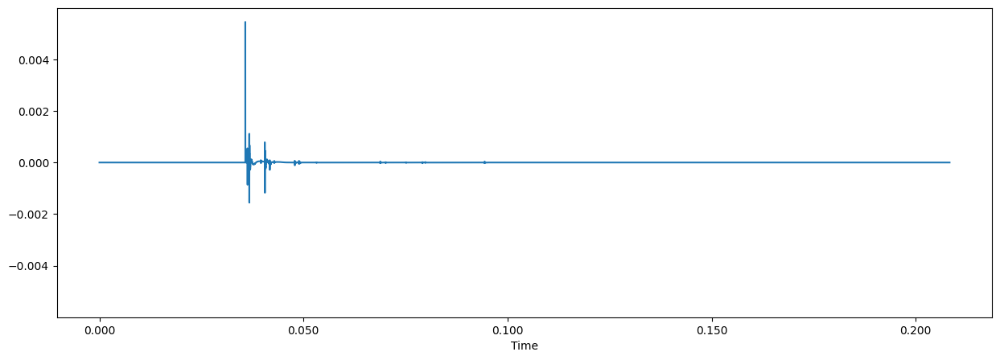

0.8961809165118697


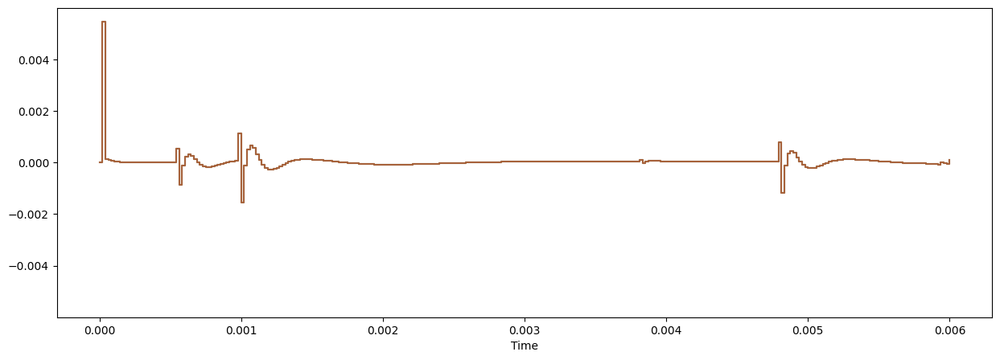

In [52]:
# plot the waveform of IR and show the audio
from librosa.display import waveshow, specshow
import IPython

waveshow(ir[0, :10000], sr=48000)
plt.show()
i_start = np.where((ir!=0).any(0))[0][0]-1
i_end = np.where((ir/ir.max()>2e-2).any(0))[0][-1]
for i in range(len(ir)):
    waveshow(ir[0, i_start:i_end], sr=48000, alpha=0.5)
print((ir[0]==ir[1]).mean())
IPython.display.Audio(ir, rate=48000)

In [35]:
# one example for how to use IR data to get the reverberant speech
sr, vocal = wavfile.read('res/singing.wav')
print(sr, vocal.shape)
IPython.display.Audio(vocal, rate=sr)

48000 (233873,)


/tmp/ipykernel_36364/3675352108.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sr, vocal = wavfile.read('res/singing.wav')


In [36]:
from scipy.signal import fftconvolve

# convolve the vocal with IR
convolved_vocal = np.array([fftconvolve(vocal, ir_channel) for ir_channel in ir]) 
IPython.display.Audio(convolved_vocal, rate=sr)

RT60 of the rendered IR is 0.4299 seconds


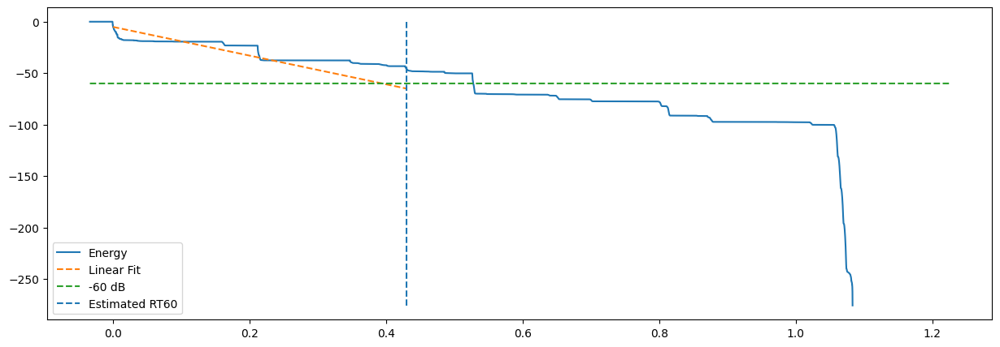

In [37]:
from pyroomacoustics.experimental.rt60 import measure_rt60

rt60 = measure_rt60(ir[0], sr, decay_db=30, plot=True)
print(f'RT60 of the rendered IR is {rt60:.4f} seconds')